In [2]:
import pandas as pd
import numpy as np
from scipy import stats

In [3]:
df = pd.read_excel(r"C:\Users\Saarthak\Desktop\Bepec\Projects\Credit card trend analysis\default_of_credit_card_clients_0.xlsx")
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,0,0,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,0,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,0,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,0,0,0,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


## DATA PREPROCESSING


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [5]:
df.rename(columns = {'PAY_0':'PAY_1'},inplace = True)

In [6]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,0.356767,0.320033,0.304067,0.258767,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,0.760594,0.801727,0.790589,0.761113,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,0.000000,0.000000,0.000000,0.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,0.000000,0.000000,0.000000,0.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [7]:
df['AGE'].median()

34.0

In [8]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_1                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df['SEX'].unique()

array([2, 1], dtype=int64)

In [11]:
df['SEX'].value_counts().index

Index([2, 1], dtype='int64', name='SEX')

In [12]:
#Evaluating values in marriage column 
df['MARRIAGE'].value_counts()

MARRIAGE
2    15964
1    13659
3      323
0       54
Name: count, dtype: int64

In [13]:
df['MARRIAGE'].unique()

array([1, 2, 3, 0], dtype=int64)

In [14]:
df['MARRIAGE'] = df['MARRIAGE'].replace(0,3)


In [15]:
df['MARRIAGE'].unique()

array([1, 2, 3], dtype=int64)

In [16]:
df['MARRIAGE'].value_counts()

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

In [17]:
#Evaluating values in 'EDUCATION' column
df['EDUCATION'].unique()

array([2, 1, 3, 5, 4, 6, 0], dtype=int64)

In [18]:
df['EDUCATION'].value_counts()

EDUCATION
2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: count, dtype: int64

In [19]:
df['EDUCATION'] = df['EDUCATION'].replace([0,5,6],4)

In [20]:
df['EDUCATION'].value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [21]:
df['SEX'].value_counts()

SEX
2    18112
1    11888
Name: count, dtype: int64

# EDA

In [22]:
import plotly.express as px

fig = px.histogram(df, x=df['AGE'],nbins = 20, title = 'AGE DISTRIBUTION',labels={'age': 'Age', 'count': 'Count'}, color_discrete_sequence=['#636EFA'], template='plotly_white')
fig.show()


In [23]:
# Calculate frequencies
freq1 = df['MARRIAGE'].value_counts().reset_index()
freq1.columns = ['MARRIAGE', 'Frequency']

# Create a bar graph
fig = px.bar(freq1, x='MARRIAGE', y='Frequency', 
             labels={'MARRIAGE': 'Marriage Categories', 'Frequency': 'Frequency'},
             title='Marriage Categories Frequencies',
             template='plotly_white')

# Show plot
fig.show()

In [24]:

freq = df['SEX'].value_counts().reset_index()
freq.columns = ['SEX','Count']

# Map category values to labels
labels = {1: 'Male', 2: 'Female'}
freq['SEX'] = freq['SEX'].map(labels)

fig = px.pie(freq, names='SEX', values='Count', title='Distribution of Gender')

# Show plot
fig.show()



## OUTLIER DETECTION AND TREATMENT

C:\Users\Saarthak\AppData\Local\Temp\ipykernel_12016\830974408.py:4: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




Text(0, 0.5, 'Count')

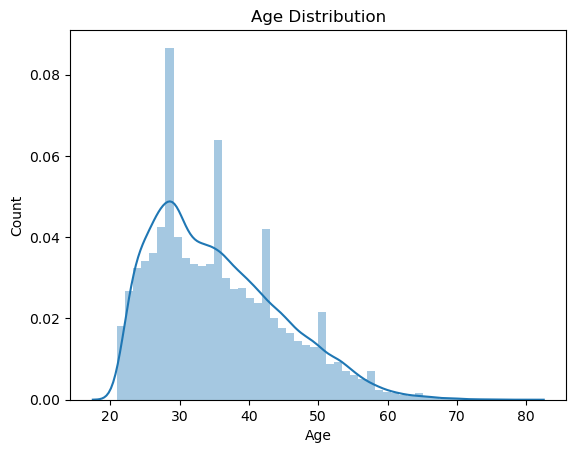

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.distplot(df['AGE'])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')

In [26]:
fig = px.box(df['AGE'],title = 'Age box plot')
fig.show()

# FEATURE ENGINEERING

In [27]:
df['Total_bill_amount'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis=1)

In [28]:
df['Total_bill_amount']

0          7704
1         17077
2        101653
3        231334
4        109339
          ...  
29995    725349
29996     21182
29997     70496
29998    266611
29999    230874
Name: Total_bill_amount, Length: 30000, dtype: int64

In [29]:
df['Total_amount_paid'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1)
df['Total_amount_paid']

0           689
1          5000
2         11018
3          8388
4         59049
          ...  
29995     42550
29996     14490
29997     31300
29998    147181
29999      8308
Name: Total_amount_paid, Length: 30000, dtype: int64

In [30]:
df['Total_outstanding_amount'] = df['Total_bill_amount'] - df['Total_amount_paid']
df['Total_outstanding_amount']

0          7015
1         12077
2         90635
3        222946
4         50290
          ...  
29995    682799
29996      6692
29997     39196
29998    119430
29999    222566
Name: Total_outstanding_amount, Length: 30000, dtype: int64

In [31]:
fig = px.box(df['Total_bill_amount'])
fig.show()

In [32]:
df['Avg_pay_delay'] = (df['PAY_1']+df['PAY_2']+df['PAY_3']+df['PAY_4']+df['PAY_5']+df['PAY_6'])/6
df['Avg_pay_delay']

0        0.666667
1        0.666667
2        0.000000
3        0.000000
4        0.000000
           ...   
29995    0.000000
29996    0.000000
29997    1.500000
29998    0.166667
29999    0.000000
Name: Avg_pay_delay, Length: 30000, dtype: float64

In [33]:
fig = px.box(df['Avg_pay_delay'])  #in months 
fig.show()

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 29 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  int64  
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_1                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  int64  
 13  BILL_AMT2                   300

# DATA ANALYSIS 

In [35]:
fig = px.scatter(df,x = df['AGE'],y = df['Total_outstanding_amount'] ,trendline = 'lowess',title = 'Total outstanding vs Age',trendline_color_override='red')
fig.show()

In [36]:
correlation = df['Total_outstanding_amount'].corr(df['AGE'])
print('Correlation coefficient between total outstanding amount and age is :',correlation)

Correlation coefficient between total outstanding amount and age is : 0.050633770673697856


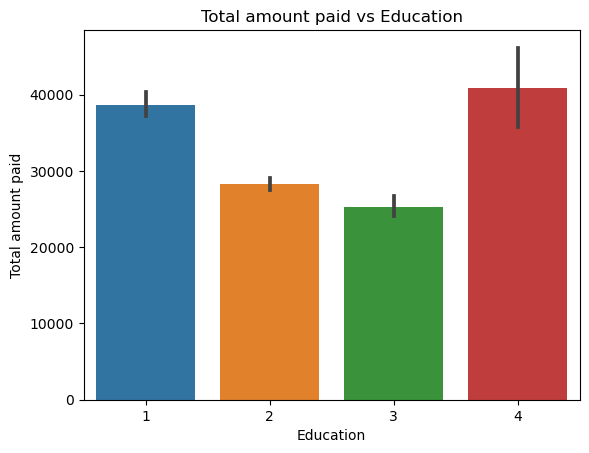

In [37]:
sns.barplot(x = df['EDUCATION'], y = df['Total_amount_paid'],data = df)
plt.xlabel('Education')
plt.ylabel('Total amount paid')
plt.title('Total amount paid vs Education')


plt.show()

In [38]:
correlation = df['Total_amount_paid'].corr(df['EDUCATION'])
print('Correlation coefficient between total amount paid and education is :',correlation)

Correlation coefficient between total amount paid and education is : -0.07119207725955626


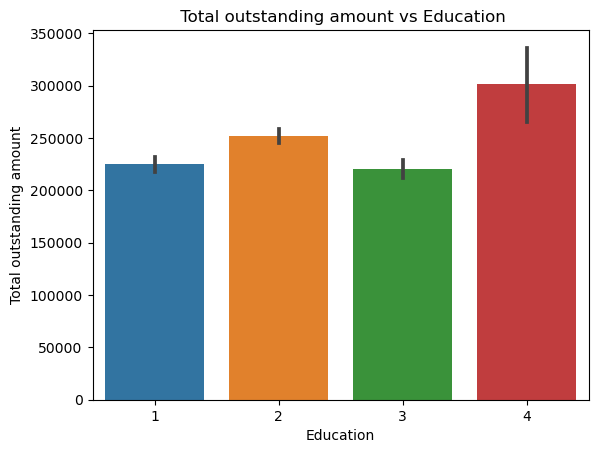

In [39]:
sns.barplot(x = df['EDUCATION'],y = df['Total_outstanding_amount'], data = df)


plt.xlabel('Education')
plt.ylabel('Total outstanding amount')
plt.title(' Total outstanding amount vs Education')


plt.show()

In [40]:
correlation = df['Total_outstanding_amount'].corr(df['EDUCATION'])
print('Correlation coefficient between total outstanding amount and education is :',correlation)

Correlation coefficient between total outstanding amount and education is : 0.013677180277042112


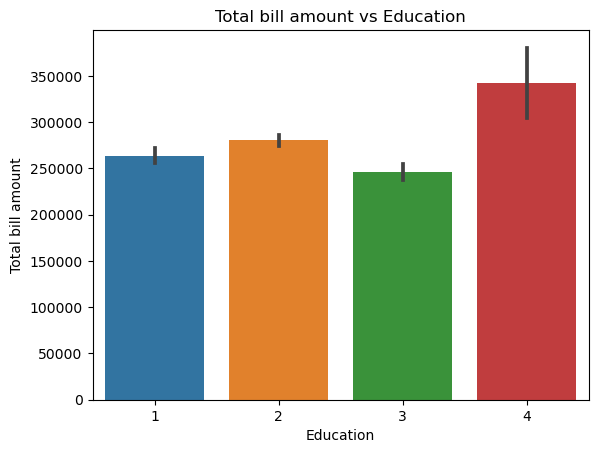

In [41]:
sns.barplot(x = df['EDUCATION'], y = df['Total_bill_amount'],data = df)
plt.xlabel('Education')
plt.ylabel('Total bill amount')
plt.title('Total bill amount vs Education')
plt.show()

In [42]:
correlation = df['Total_bill_amount'].corr(df['EDUCATION'])
print('Correlation coefficient between total bill amount and education is :',correlation)

Correlation coefficient between total bill amount and education is : 0.0016772526744722085


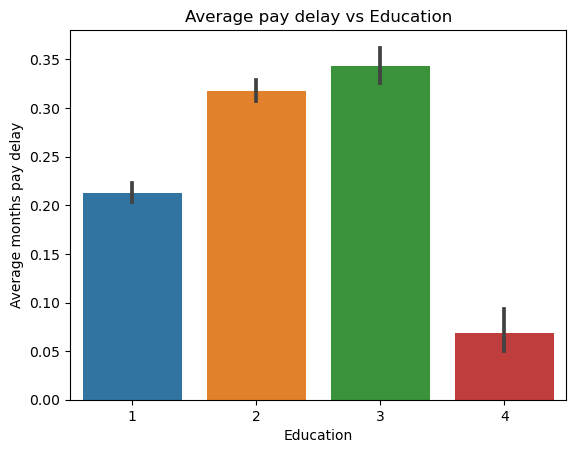

In [43]:
sns.barplot(x = df['EDUCATION'], y = df['Avg_pay_delay'],data = df)
plt.xlabel('Education')
plt.ylabel('Average months pay delay')
plt.title('Average pay delay vs Education')
plt.show()

In [44]:
df['EDUCATION'].value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [45]:
fig = px.scatter(x=df['LIMIT_BAL'],y =df['Total_outstanding_amount'],trendline = 'ols',title ='Total outstanding vs Credit limit',trendline_color_override = 'black')
fig.update_layout(xaxis_title='Credit limit',
                  yaxis_title='Total Outstanding Amount')
fig.show()

In [46]:
correlation = df['Total_outstanding_amount'].corr(df['LIMIT_BAL'])
print('Correlation coefficient between total outstanding amount and credit limit is :',correlation)

Correlation coefficient between total outstanding amount and credit limit is : 0.2566157358083033


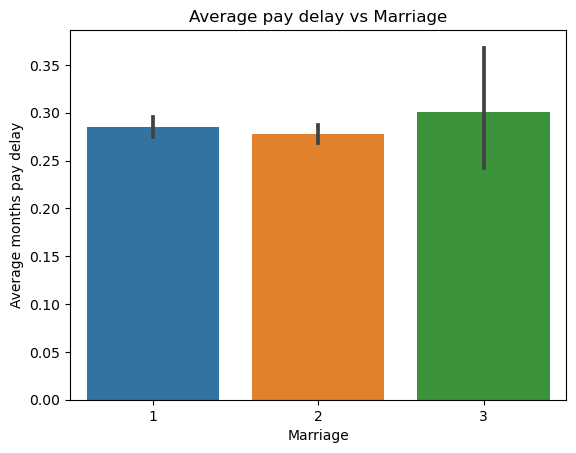

In [47]:
sns.barplot(x = df['MARRIAGE'], y = df['Avg_pay_delay'],data = df)
plt.xlabel('Marriage')
plt.ylabel('Average months pay delay')
plt.title('Average pay delay vs Marriage')
plt.show()

In [48]:
correlation = df['Avg_pay_delay'].corr(df['MARRIAGE'])
print('Correlation coefficient between average pay delay and marriage is :',correlation)

Correlation coefficient between average pay delay and marriage is : -0.004516264196345451


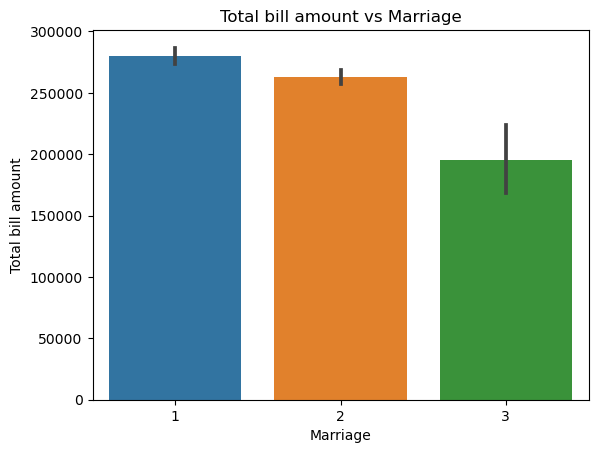

In [49]:
sns.barplot(x = df['MARRIAGE'], y = df['Total_bill_amount'],data = df)
plt.xlabel('Marriage')
plt.ylabel('Total bill amount')
plt.title('Total bill amount vs Marriage')
plt.show()

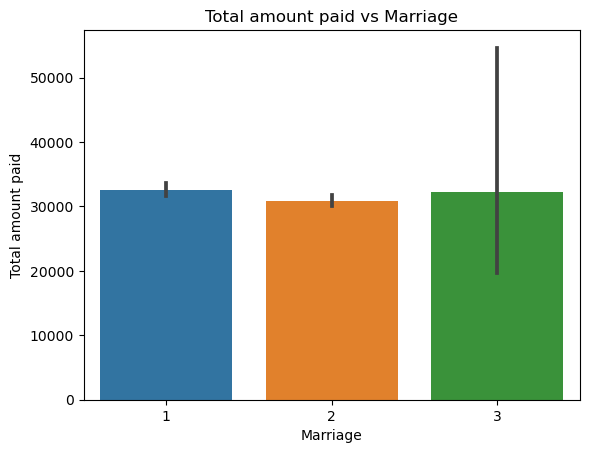

In [50]:
sns.barplot(x = df['MARRIAGE'], y = df['Total_amount_paid'],data = df)
plt.xlabel('Marriage')
plt.ylabel('Total amount paid')
plt.title('Total amount paid vs Marriage')
plt.show()

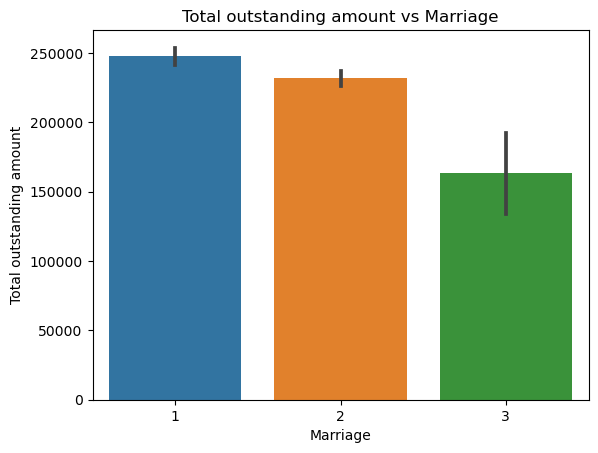

In [51]:
sns.barplot(x = df['MARRIAGE'], y = df['Total_outstanding_amount'],data = df)
plt.xlabel('Marriage')
plt.ylabel('Total outstanding amount')
plt.title('Total outstanding amount vs Marriage')
plt.show()

In [52]:
fig = px.histogram(df, x='Total_outstanding_amount', color='default payment next month',
                   marginal='rug', # Add rug plot
                   labels={'Total_outstanding_amount': 'Total Outstanding Amount',
                           'default payment next month': 'Default Payment'},
                   title='Histogram of Total Outstanding Amount by Default Payment')

# Show plot
fig.show()

In [53]:
fig = px.histogram(df, x=df['Total_outstanding_amount'], color=df['default payment next month'],
                    facet_col=df['default payment next month'],
                    labels={'Total_outstanding_amount': 'Total Outstanding Amount', 'default payment next month': 'Default Payment'},
                    title='Histogram of Total Outstanding Amount by Default Payment')
fig.update_layout(bargap=0.1)  # Reduce the gap between bars
fig.update_xaxes(range=[-3000000, 3000000])
fig.update_yaxes(range = [0,6000])
fig.show()

## HYPOTHESIS TESTING

Null Hypothesis (H0): There is no significant difference in outstanding amounts between defaulters and non-defaulters.
Alternative Hypothesis (Ha): There is a significant difference in outstanding amounts between defaulters and non-defaulters.

In [54]:
from scipy import stats

# Separate data into defaulters and non-defaulters
defaulters = df[df['default payment next month'] == 1]['Total_outstanding_amount']
non_defaulters = df[df['default payment next month'] == 0]['Total_outstanding_amount']

# Perform t-test
t_statistic, p_value = stats.ttest_ind(defaulters, non_defaulters, equal_var=False)

# Print results
print("t-statistic:", t_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in outstanding amounts between defaulters and non-defaulters.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in outstanding amounts between defaulters and non-defaulters.")


t-statistic: 0.6637189815742744
p-value: 0.5068847438633044
Fail to reject the null hypothesis: There is no significant difference in outstanding amounts between defaulters and non-defaulters.


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 29 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  int64  
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_1                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  int64  
 13  BILL_AMT2                   300

# Machine Learning Model

In [60]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix


# Encode categorical variables
label_encoder = LabelEncoder()
df['SEX'] = label_encoder.fit_transform(df['SEX'])
df['EDUCATION'] = label_encoder.fit_transform(df['EDUCATION'])
df['MARRIAGE'] = label_encoder.fit_transform(df['MARRIAGE'])

# Split the data into features and target variable
X = df.drop('default payment next month', axis=1)
y = df['default payment next month']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Take the absolute value of negative numbers in the features
X_train_abs = X_train.abs()
X_test_abs = X_test.abs()

# Feature Selection
selector = SelectKBest(score_func=chi2, k=10)
X_train_selected = selector.fit_transform(X_train_abs, y_train)
X_test_selected = selector.transform(X_test_abs)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_selected)
X_test_scaled = scaler.transform(X_test_selected)

# Model Building
lr_model = LogisticRegression()
lr_model.fit(X_train_scaled, y_train)

dt_model = DecisionTreeClassifier()
dt_model.fit(X_train_scaled, y_train)

# Model Evaluation
y_pred_lr = lr_model.predict(X_test_scaled)
y_pred_dt = dt_model.predict(X_test_scaled)

print("Logistic Regression:")
print(classification_report(y_test, y_pred_lr))
print("ROC-AUC Score:", roc_auc_score(y_test, lr_model.predict_proba(X_test_scaled)[:, 1]))

print("Decision Tree Classifier:")
print(classification_report(y_test, y_pred_dt))
print("ROC-AUC Score:", roc_auc_score(y_test, dt_model.predict_proba(X_test_scaled)[:, 1]))


Logistic Regression:
              precision    recall  f1-score   support

           0       0.78      1.00      0.88      4687
           1       0.00      0.00      0.00      1313

    accuracy                           0.78      6000
   macro avg       0.39      0.50      0.44      6000
weighted avg       0.61      0.78      0.69      6000

ROC-AUC Score: 0.6690314852167628
Decision Tree Classifier:
              precision    recall  f1-score   support

           0       0.81      0.80      0.81      4687
           1       0.32      0.34      0.33      1313

    accuracy                           0.70      6000
   macro avg       0.57      0.57      0.57      6000
weighted avg       0.71      0.70      0.70      6000

ROC-AUC Score: 0.5773350832974353


C:\Users\Saarthak\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Saarthak\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Saarthak\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



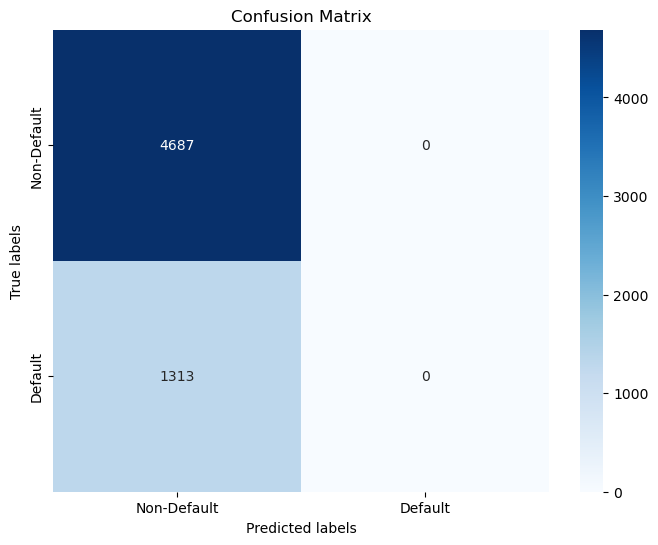

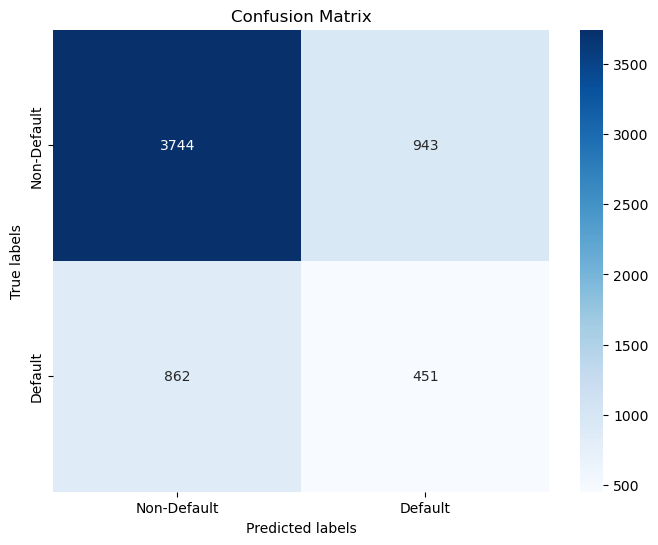

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

#function for ploting confusion matrix
def plot_confusion_matrix(model, X_test, y_test):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=['Non-Default', 'Default'], 
                yticklabels=['Non-Default', 'Default'])
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()

# Plot confusion matrix for Logistic Regression model
plot_confusion_matrix(lr_model, X_test_scaled, y_test)

# Plot confusion matrix for Decision Tree Classifier model
plot_confusion_matrix(dt_model, X_test_scaled, y_test)


In [66]:
#Default rate for the project
total_observations = len(df)
total_defaults = df['default payment next month'].sum()

default_rate = total_defaults / total_observations
print("Overall Default Rate:", default_rate)


Overall Default Rate: 0.2212


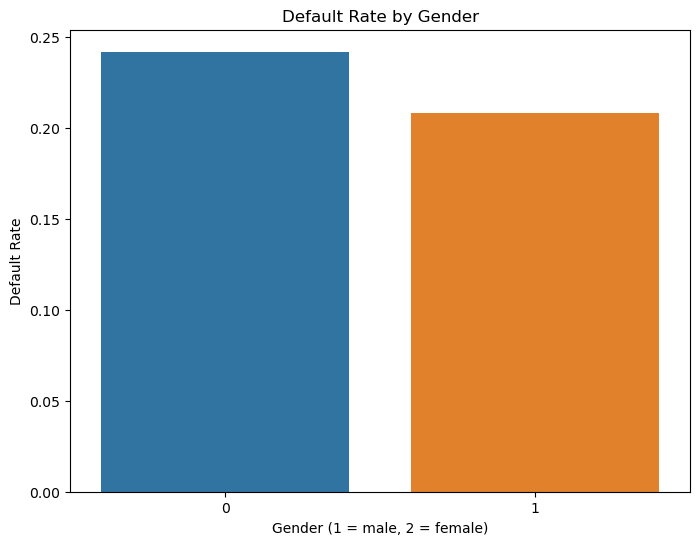

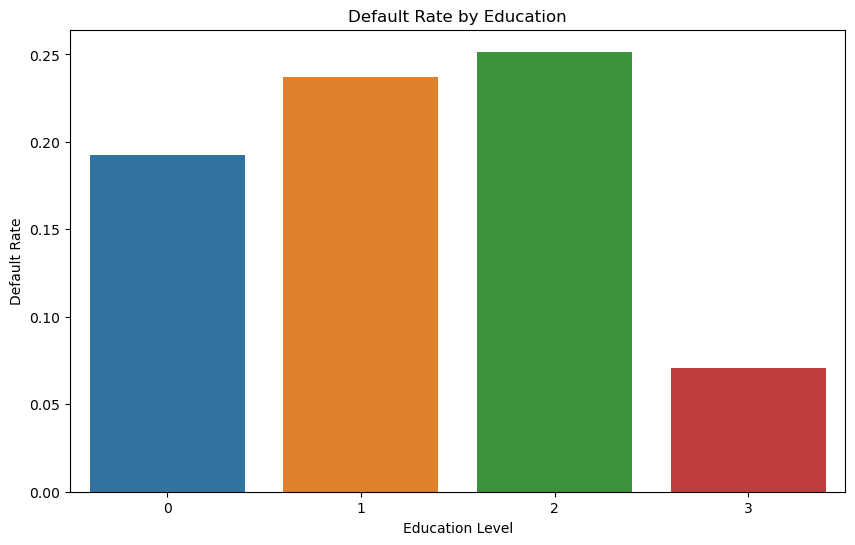

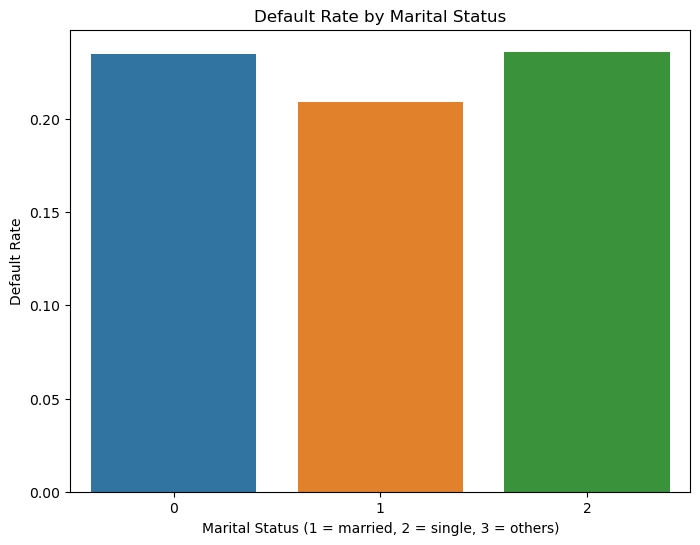

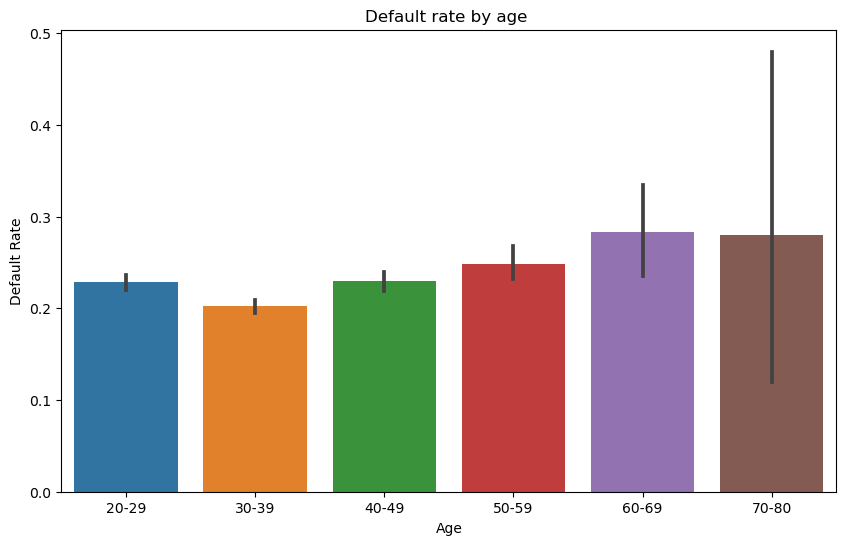

In [74]:

# Calculate default rate for different demographic groups
def calculate_default_rate(df, groupby_column):
    default_rates = df.groupby(groupby_column)['default payment next month'].mean().reset_index()
    default_rates.columns = [groupby_column, 'Default Rate']
    return default_rates

# Plot default rate for gender
gender_default_rate = calculate_default_rate(df, 'SEX')
plt.figure(figsize=(8, 6))
sns.barplot(x='SEX', y='Default Rate', data=gender_default_rate)
plt.title('Default Rate by Gender')
plt.xlabel('Gender (1 = male, 2 = female)')
plt.ylabel('Default Rate')
plt.show()

# Plot default rate for education
education_default_rate = calculate_default_rate(df, 'EDUCATION')
plt.figure(figsize=(10, 6))
sns.barplot(x='EDUCATION', y='Default Rate', data=education_default_rate)
plt.title('Default Rate by Education')
plt.xlabel('Education Level')
plt.ylabel('Default Rate')
plt.show()

# Plot default rate for marital status
marital_default_rate = calculate_default_rate(df, 'MARRIAGE')
plt.figure(figsize=(8, 6))
sns.barplot(x='MARRIAGE', y='Default Rate', data=marital_default_rate)
plt.title('Default Rate by Marital Status')
plt.xlabel('Marital Status (1 = married, 2 = single, 3 = others)')
plt.ylabel('Default Rate')
plt.show()

#plot for age and default rate relation

bins = [20,30,40,50,60,70,80]
labels =['20-29','30-39','40-49','50-59','60-69','70-80']
df['Age_category'] = pd.cut(df['AGE'],bins = bins, labels = labels, right = False)
age_default_rate = calculate_default_rate(df,'AGE')
plt.figure(figsize = (10,6))
sns.barplot(x =df['Age_category'], y = df['default payment next month'], data = age_default_rate)
plt.title('Default rate by age ')
plt.xlabel('Age')
plt.ylabel('Default Rate')
plt.show()


In [68]:
df.corr()['default payment next month']

ID                           -0.013952
LIMIT_BAL                    -0.153520
SEX                          -0.039961
EDUCATION                     0.033842
MARRIAGE                     -0.027575
AGE                           0.013890
PAY_1                         0.396019
PAY_2                         0.327093
PAY_3                         0.286999
PAY_4                         0.269055
PAY_5                         0.260850
PAY_6                         0.244437
BILL_AMT1                    -0.019644
BILL_AMT2                    -0.014193
BILL_AMT3                    -0.014076
BILL_AMT4                    -0.010156
BILL_AMT5                    -0.006760
BILL_AMT6                    -0.005372
PAY_AMT1                     -0.072929
PAY_AMT2                     -0.058579
PAY_AMT3                     -0.056250
PAY_AMT4                     -0.056827
PAY_AMT5                     -0.055124
PAY_AMT6                     -0.053183
default payment next month    1.000000
Total_bill_amount        

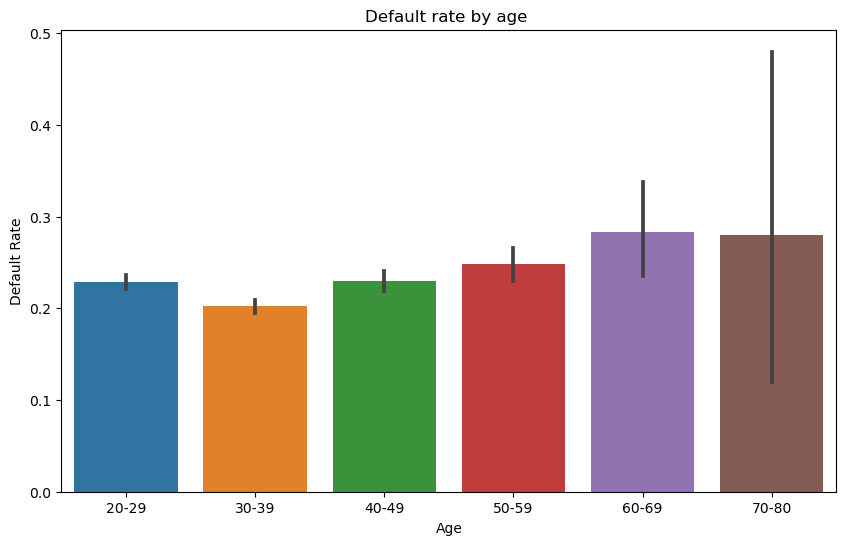

In [75]:
bins = [20,30,40,50,60,70,80]
labels =['20-29','30-39','40-49','50-59','60-69','70-80']
df['Age_category'] = pd.cut(df['AGE'],bins = bins, labels = labels, right = False)
age_default_rate = calculate_default_rate(df,'AGE')
plt.figure(figsize = (10,6))
sns.barplot(x =df['Age_category'], y = df['default payment next month'], data = age_default_rate)
plt.title('Default rate by age ')
plt.xlabel('Age')
plt.ylabel('Default Rate')
plt.show()
